<a href="https://colab.research.google.com/github/samiyaalizaidi/COD-with-YOLOv8-Segmentation/blob/main/notebooks/YOLOv8_Segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Segmentation with YOLOv8**
---


## Install and Import the Necessary Libraries




In [1]:
# to run YOLOv8 itself
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 663.2/663.2 kB 10.3 MB/s eta 0:00:00


In [2]:
# import the libraries
from ultralytics import YOLO
import matplotlib.pyplot as plt
from PIL import Image
import os
from IPython.display import Image

---
## Prepare the Dataset

The YAML file

In [3]:
%cat "/content/drive/MyDrive/CAMO-Labels/data.yaml"

names:
- Camo
nc: 1
test: /content/drive/MyDrive/CAMO-Labels/test/images
train: /content/drive/MyDrive/CAMO-Labels/train/images
val: /content/drive/MyDrive/CAMO-Labels/val/images


In [4]:
# path to the YAML file
dataset = "/content/drive/MyDrive/CAMO-Labels/data.yaml"

---
## Train the Model


#### Load the Pretrained model first.

In [5]:
model = YOLO('yolov8n-seg.yaml')
model = YOLO('yolov8n-seg.pt')


                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128

100%|██████████| 6.73M/6.73M [00:00<00:00, 246MB/s]


In [ ]:
custom_model = model.train(data=dataset,
                           epochs=250,
                           batch=8,
                           patience=50)

#### Display the results

In [9]:
%load_ext tensorboard
%tensorboard --logdir runs/segment/train2

<IPython.core.display.Javascript object>

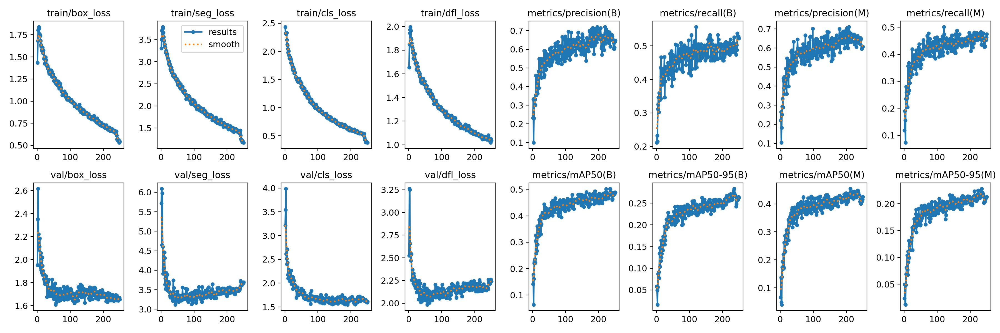

In [10]:
Image("/content/runs/segment/train2/results.png")

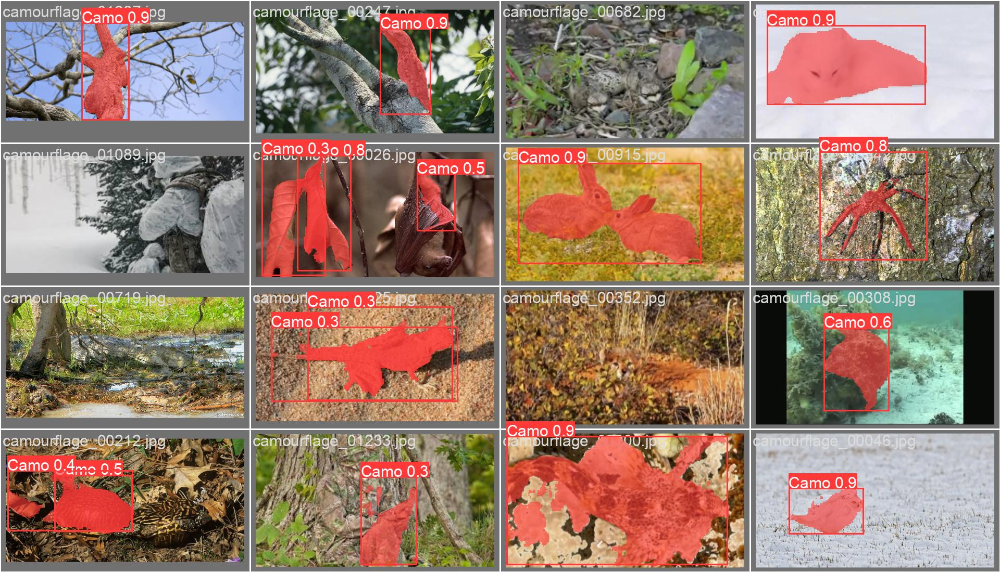

In [11]:
Image(filename='/content/runs/segment/train2/val_batch0_pred.jpg')

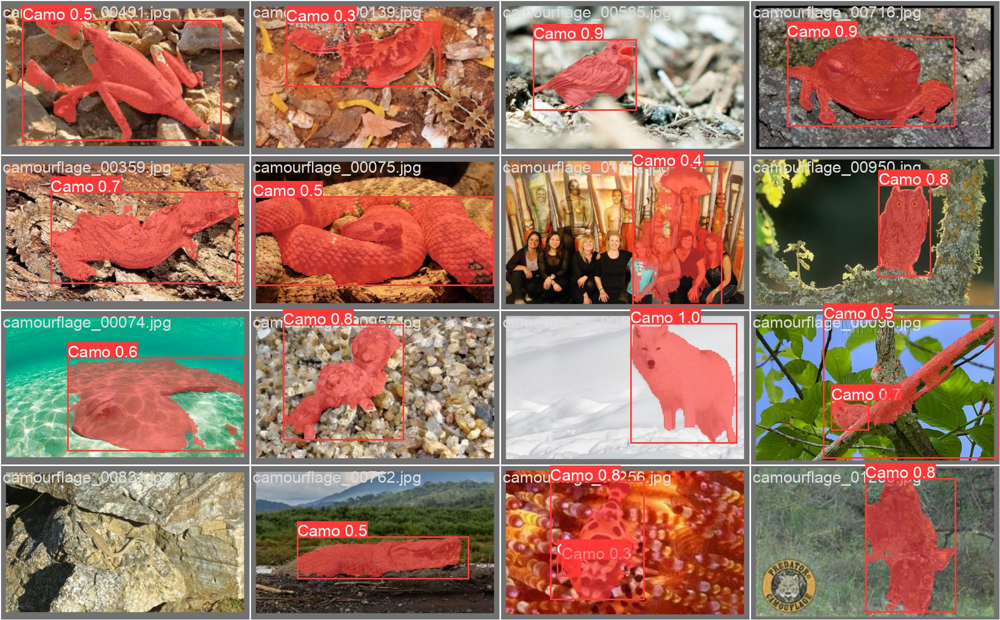

In [12]:
Image('/content/runs/segment/train2/val_batch1_pred.jpg')

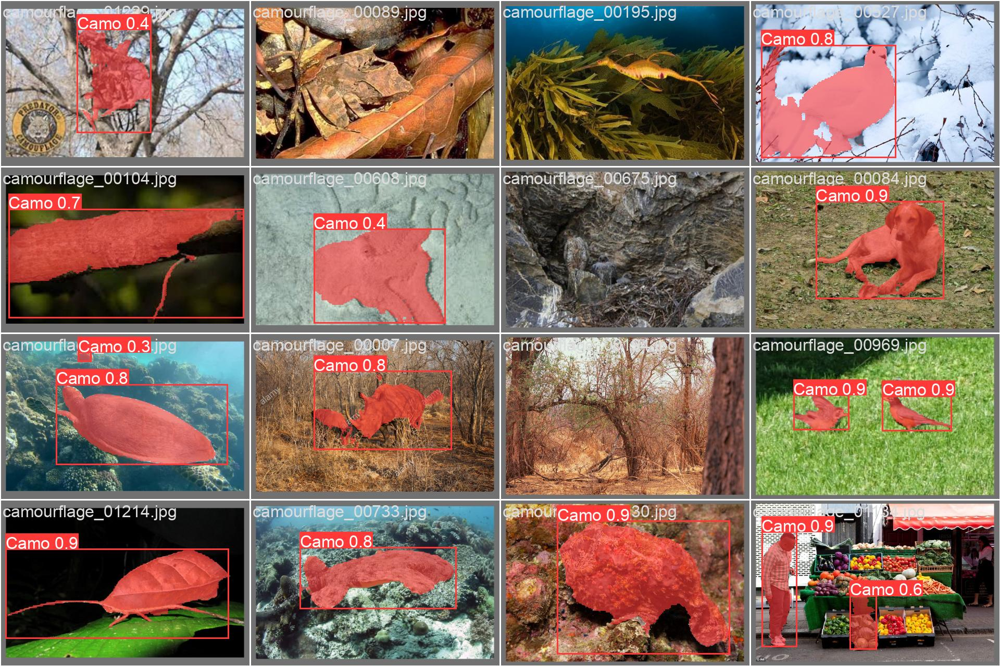

In [13]:
Image('/content/runs/segment/train2/val_batch2_pred.jpg')

---
## Testing

In [14]:
new_model = YOLO("/content/runs/segment/train2/weights/best.pt")

In [24]:
sample_img = '/content/drive/MyDrive/CAMO-Labels/test/camourflage_00122.jpg'

In [25]:
results = new_model.predict(source=sample_img, conf=0.3)


image 1/1 /content/drive/MyDrive/CAMO-Labels/test/camourflage_00122.jpg: 512x640 3 Camos, 133.2ms
Speed: 4.8ms preprocess, 133.2ms inference, 14.5ms postprocess per image at shape (1, 3, 512, 640)


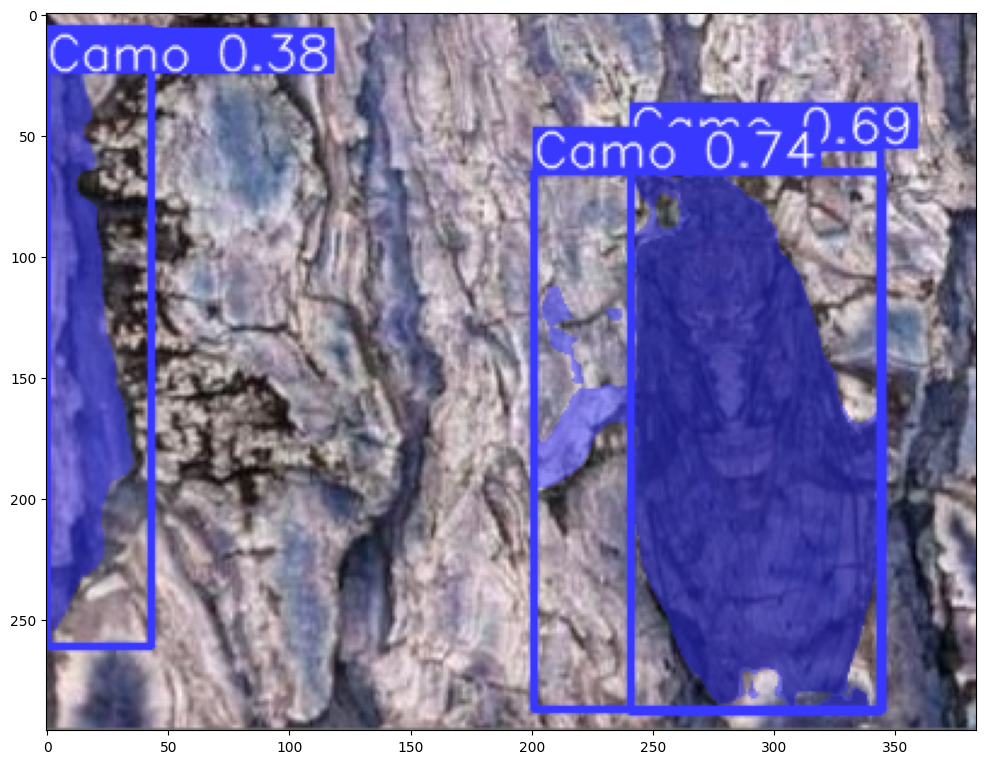

In [26]:
results_array = results[0].plot()
plt.figure(figsize=(12, 12))
plt.imshow(results_array)

---
## Extracting Segmentation Masks

In [27]:
results = results[0]

In [28]:
results

ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'Camo'}
orig_img: array([[[ 62,  49,  63],
        [148, 136, 148],
        [199, 185, 197],
        ...,
        [ 83,  84, 105],
        [ 56,  59,  80],
        [ 53,  57,  76]],

       [[  7,   0,   8],
        [ 70,  57,  71],
        [157, 143, 155],
        ...,
        [ 86,  87, 108],
        [ 57,  61,  80],
        [ 54,  58,  77]],

       [[ 28,  17,  33],
        [ 42,  32,  45],
        [ 91,  79,  91],
        ...,
        [ 77,  78,  99],
        [ 62,  66,  85],
        [ 71,  75,  94]],

       ...,

       [[ 91,  85,  90],
        [ 88,  82,  87],
        [ 78,  71,  74],
        ...,
        [161, 171, 188],
        [167, 182, 198],
        [148, 164, 180]],

       [[ 92,  88,  93],
        [ 92,  86,  91],
        [ 84,  77,  80],
        ...,
        [153, 166, 182],
        [141, 1

In [29]:
results.masks.xyn

[array([[    0.63438,     0.22635],
        [    0.63281,     0.22838],
        [    0.63125,     0.22838],
        ...,
        [     0.6625,     0.22838],
        [    0.65625,     0.22838],
        [    0.65469,     0.22635]], dtype=float32),
 array([[    0.63906,     0.19189],
        [     0.6375,     0.19392],
        [    0.63281,     0.19392],
        [    0.63281,     0.23851],
        [    0.63438,     0.24054],
        [    0.63438,     0.24459],
        [     0.6375,     0.24865],
        [     0.6375,     0.25068],
        [    0.63906,      0.2527],
        [    0.63906,     0.25473],
        [    0.64531,     0.26284],
        [    0.64531,     0.26486],
        [    0.64688,     0.26689],
        [    0.64688,     0.26892],
        [    0.64844,     0.27095],
        [    0.64844,     0.27297],
        [       0.65,       0.275],
        [       0.65,     0.27703],
        [    0.64844,     0.27905],
        [    0.64844,     0.28311],
        [    0.64688,     0.28514]

In [31]:
mask = results.masks.data
print(mask.shape)

torch.Size([3, 512, 640])


In [32]:
masks_array = mask.cpu().numpy()

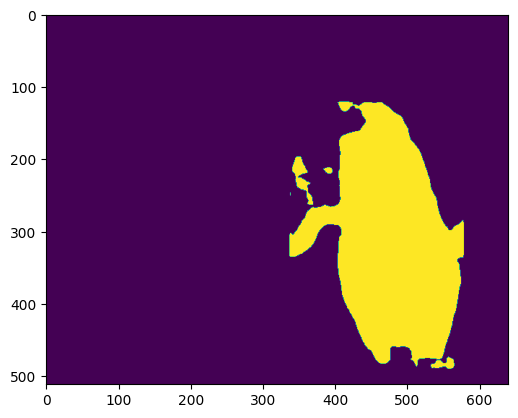

In [33]:
plt.imshow(masks_array[0])

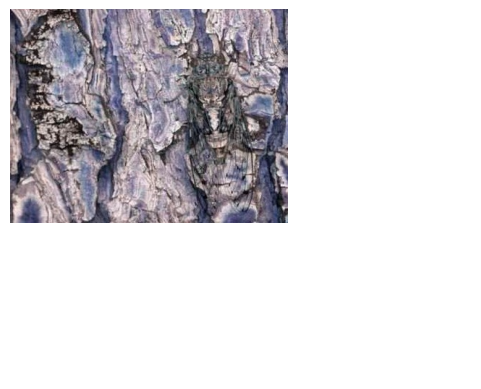

In [42]:
# display with the original image

plt.imshow(results.orig_img, cmap='gray')
plt.imshow(masks_array[0], cmap='jet', alpha=0)
plt.axis('off') # Turn off axis labels
plt.show()